# Parte 1

In [1]:
import numpy as np
from PIL import Image
import matplotlib.pyplot as plt
import plotly.graph_objects as go
import math

In [2]:
def plot_isosurface(X,Y,Z,values,isomin,isomax,surface_count,opacity=1,colorbar_ticks=10):
    data = go.Isosurface(
        x=X.flatten(),
        y=Y.flatten(),
        z=Z.flatten(),
        value=values.flatten(),
        opacity=opacity,
        isomin=isomin,
        isomax=isomax,
        surface_count=surface_count,
        colorbar_nticks=colorbar_ticks, 
        caps=dict(x_show=False, y_show=False),
    )
    go.Figure(data).show()

In [3]:
min_ = -5.5
max_ = 5.5
steps = 40j
X, Y, Z = np.mgrid[min_:max_:steps, min_:max_:steps, min_:max_:steps]
values = np.sin(np.sqrt(X**2 + Y**2 + Z**2)) / np.sqrt(X**2 + Y**2 + Z**2)

In [4]:
plot_isosurface(X,Y,Z,values,isomin=-0.2, isomax=0,surface_count=2, opacity=0.9)

## Campo escalar 2
$$v_2 = xe^{-x^2-y^2-z^2}$$

In [5]:
min_ = -1.5
max_ = 1.5
steps = 30j
X, Y, Z = np.mgrid[min_:max_:steps, min_:max_:steps, min_:max_:steps]
values = X*np.power(np.e, -X**2-Y**2-Z**2)

In [6]:
plot_isosurface(X,Y,Z,values,isomin=-0.2, isomax=0.2 ,surface_count=2, colorbar_ticks=10)

# Parte 2

## Inciso 1

In [9]:
def display_raw(array):
    plt.title(array.shape)
    plt.imshow(array, cmap='gray')
    plt.show

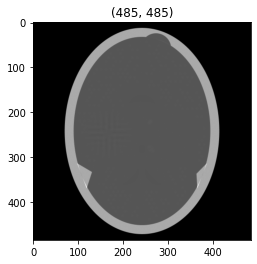

In [4]:
raw_img = np.fromfile('phantom.raw', dtype=np.float64).reshape(485, 485)
display_raw(raw_img)

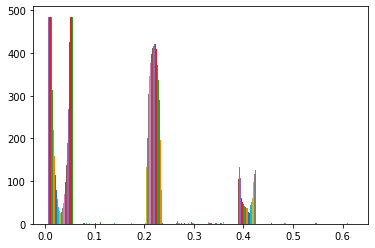

In [5]:
plt.hist(raw_img)
plt.show()

In [5]:
A = []
for row in range(raw_img.shape[0]):
    for col in range(raw_img.shape[1]):
        pixel = raw_img[row][col]
        if pixel > 0.2 and pixel < 0.25:
            A.append(pixel)

In [6]:
min_A = min(A)
max_A = max(A)
print(f'Mínimo: {min_A}, Máximo: {max_A}')

Mínimo: 0.20008127391338348, Máximo: 0.24971257150173187


In [9]:
raw_img_cpy = np.copy(raw_img) # Copia de la imagen original
# Iteración sobre los renglones y columnas de la matriz
for row in range(raw_img_cpy.shape[0]):
    for col in range(raw_img_cpy.shape[1]):
        pixel = raw_img_cpy[row][col]
        # Verificamos que el pixel esté en la vecindad de 0.2
        if pixel > 0.2 and pixel < 0.225:
            norm = (pixel-min_A) / (max_A - min_A) # Normalización del valor del pixel
            # Igualamos a 0 cuando el pixel equivale al mínimo
            if pixel == min_A: 
                raw_img_cpy[row][col] = 0 
                continue
            # De lo contrario, asignamos su valor normalizado + 0.1
            raw_img_cpy[row][col] = norm + 0.1
        elif pixel > 0.395 and pixel < 0.43: # Incrementa el contraste del anillo en gris claro
            raw_img_cpy[row][col] = 0.27

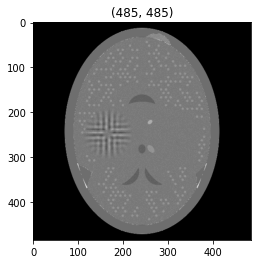

In [10]:
display_raw(raw_img_cpy)

## Inciso 2

In [62]:
def resize_image(image, scaling_factor):
    """
        Function that handles bilinear interpolation image rescaling

        Parameters:
        -----------
        image: ndarray
            Image matrix representing a given image where each value holds the pixel color
        
        scaling_factor: int
            Integer representing the scaling factor of the image to be rescaled

        Returns:
        --------
        scaled_image: ndarray
            Image matrix representing the new matrix with the scaling factor
    """
    # num_to_ignore is a value used to fill initial empty positions when
    # rescaling the original image to the scaled image final size
    num_to_ignore=-1

    # new_empty_image is a matrix that will contain scaled image final dimensions
    new_empty_image = build_empty_image(image, scaling_factor, num_to_ignore)

    # Linear and bilinear interpolation
    scaled_columns_image = interpolate_image(new_empty_image, num_to_ignore, axis=0)
    scaled_image = interpolate_image(scaled_columns_image, num_to_ignore, axis=1)
    return scaled_image

def build_empty_image(image, scaling_factor, num_to_ignore):
    """
        Function that adds the necessary empty columns and rows based on the scaling_factor

        Parameters:
        -----------
        image: ndarray
            Image matrix representing a given image where each value holds the pixel color
        
        scaling_factor: int
            Integer representing the scaling factor of the image to be rescaled

        Returns:
        --------
        empty_image: ndarray
            Image matrix representing the new matrix with the scaled new size and empty values
    """
    (M, N) = (image.shape[0], image.shape[1])
    (new_M, new_N) = (M*scaling_factor, N*scaling_factor)
    empty_image = np.copy(image)
    # Rows addition
    empty_image = add_elements(empty_image, M, new_M, num_to_ignore, axis=0)
    # Columns addition
    empty_image = add_elements(empty_image, N, new_N, num_to_ignore, axis=1)
    return empty_image


def add_elements(image, old_size, new_size, num_to_ignore, axis):
    missing_elements_to_insert = new_size - old_size
    num_times_to_insert = old_size - 1
    elements_to_insert = np.array_split(np.arange(missing_elements_to_insert), num_times_to_insert)
    start_idx = 1
    image_to_add = np.copy(image)
    for elements in elements_to_insert:
        num_elements_to_insert = len(elements)
        for num_el in range(num_elements_to_insert):
            image_to_add = np.insert(image_to_add, start_idx+num_el, num_to_ignore, axis=axis)
        start_idx += num_elements_to_insert + 1
    return image_to_add 

def interpolate_image(image, num_to_ignore, axis):
    """
        Function that makes a linear interpolation in a given image through a given axis

        Parameters:
        -----------
        image: ndarray
            Matrix containing RGB values per each combination of row and column
        
        num_to_ignore: int
            Integer representing the empty value (non RGB value) inside the matrix

        axis: int
            axis = 0 <- rows
            axis = 1 <- columns

        Return:
        -------
        image: ndarray
            Iterpolated image
    """
    # either first row or first colum in image
    element = image[:,0] if axis == 0 else image[0]

    # indices of RGB values in element
    reference_points_indices = np.where(element != num_to_ignore)[0]
    num_rgb_values_in_element = reference_points_indices.shape[0]

    for i in range(1, num_rgb_values_in_element):
        # indices of point of reference 1 (x1) and point of reference two (x2)
        first_ref_idx = reference_points_indices[i-1]
        second_ref_idx = reference_points_indices[i]

        # getting whole columns and rows in image based on points of reference
        y1 = image[:,first_ref_idx] if axis == 1 else image[first_ref_idx]
        x1 = np.repeat(first_ref_idx, image.shape[axis])
        y2 = image[:,second_ref_idx] if axis == 1 else image[second_ref_idx]
        x2 = np.repeat(second_ref_idx, image.shape[axis])

        # Iterate in all the missing values between two points of references
        # and perform linear interpolation
        for x in range(first_ref_idx+1, second_ref_idx):
            y = linear_interpolation(x1,y1,x2,y2,x)
            if axis == 0: image[x] = y
            else: image[:,x] = y
    return image

def linear_interpolation(x1, y1, x2, y2, x):
    """
        Function that performs linear interpolation

        Parameters:
        -----------
        <x1, y1, x2, y2, x>: ndarray or int
            Given a ndarray as parameter, this function will perform vector operations

        Return:
        -------
        y: int
            Interpolated value
    """
    return abs(y1 + np.round((x-x1)*(y2-y1)/(x2-x1),0))

def zoom_image(image, x, size_x, y, size_y):
    """
        Function that returns the zoomed image given a set of parameters

        Parameters:
        -----------
        image: ndarray
            Matrix representing the image with RGB values
        <x,y>: int
            Initial x or y position 
        <size_x, size_y>: int
            Number of pixels to obtain starting at x or y
        
        Return:
        -------
        Image at given positions
    """
    return image[y:y+size_y+1][:,x:x+size_x+1]

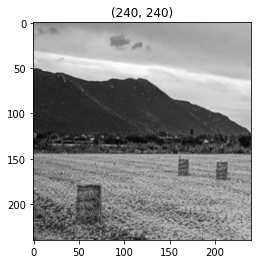

In [60]:
rimage = np.array(Image.open('landscape.png').convert('L'), dtype=int)
display_raw(rimage)

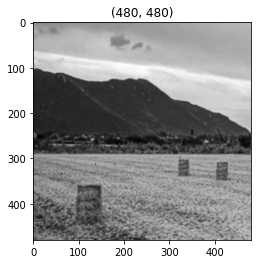

In [61]:
image_2x = resize_image(rimage, scaling_factor=2)
display_raw(image_2x)

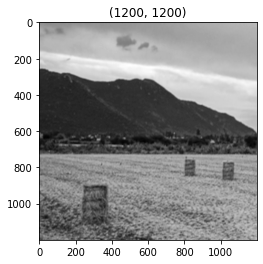

In [47]:
image_5x = resize_image(rimage, scaling_factor=5)
display_raw(image_5x)

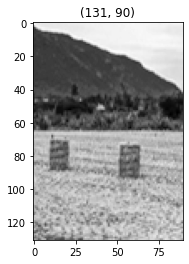

In [52]:
zoomed_img = zoom_image(rimage, x=150, size_x=90, y=80, size_y=130)
display_raw(zoomed_img)

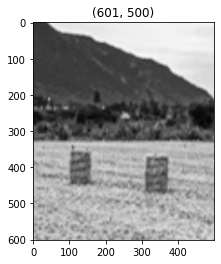

In [57]:
zoomed_img = zoom_image(image_5x, x=700, size_x=500, y=400, size_y=600)
display_raw(zoomed_img)